1. Сначала загружаются и предобрабатываются данные: заполняются пропуски и стандартизируются значения.
2. Затем применяется алгоритм DBSCAN для кластеризации данных, где аномалии помечаются меткой -1.
3. Далее анализируются полученные кластеры, выделяются мелкие кластеры, что может помочь в выявлении шумовых или незначительных аномалий.
4. Для визуализации данных строятся графики временных рядов для каждого сенсора, на которых аномалии отмечаются красными точками.

Статистика по кластерам:
     Cluster  Count
0         -1   3965
1          0    268
2          1   1595
3          2  98933
4          3      9
..       ...    ...
578      577     20
579      578      5
580      579      8
581      580     44
582      581     15

[583 rows x 2 columns]
Мелкие кластеры:
     Cluster  Count
4          3      9
5          4      6
6          5     10
7          6     14
9          8     43
..       ...    ...
578      577     20
579      578      5
580      579      8
581      580     44
582      581     15

[451 rows x 2 columns]


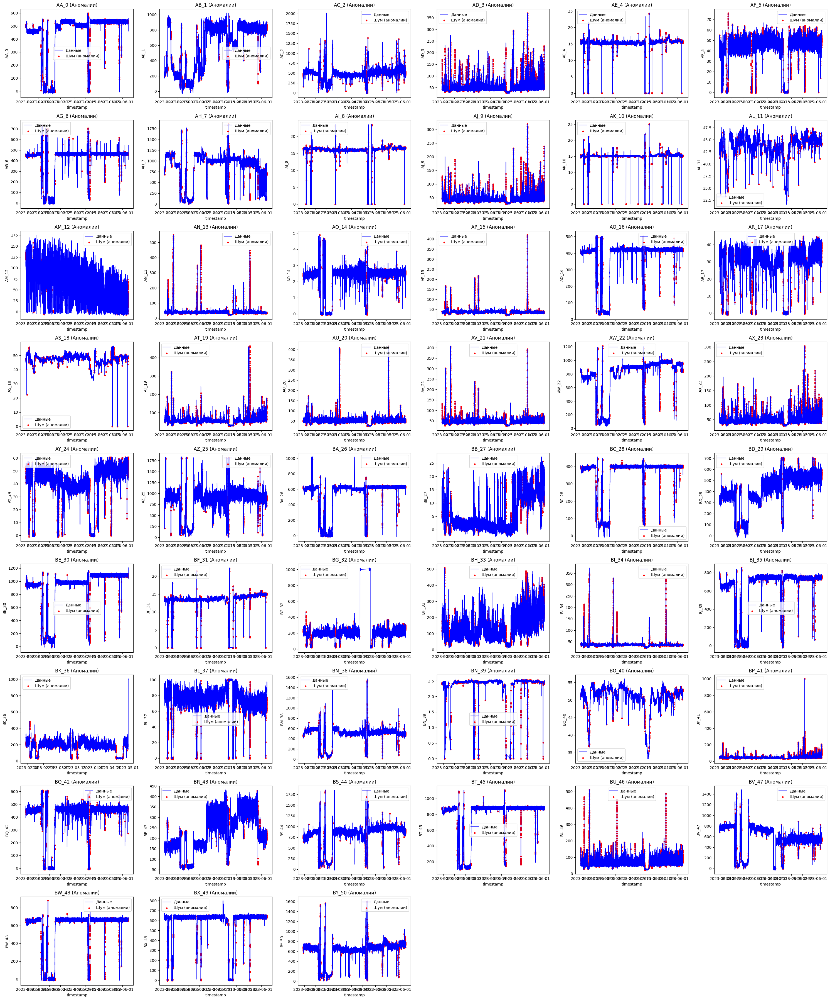

In [ ]:
import pandas as pd
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Загрузка данных
file_path = 'results.csv'
df = pd.read_csv(file_path)

# Преобразуем столбец 'timestamp' в формат datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Выбираем данные сенсоров для анализа
sensor_columns = df.columns.difference(['Unnamed: 0', 'timestamp'])
data = df[sensor_columns]

# Обработка пропусков (заполнение медианой)
data = data.fillna(data.median())

# Стандартизация данных
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Применение DBSCAN для кластеризации аномалий
dbscan = DBSCAN(eps=1.5, min_samples=5)
labels = dbscan.fit_predict(data_scaled)

# Добавление меток кластеров в DataFrame
df['anomaly_cluster'] = labels

# Вывод статистики по кластерам
unique_labels, counts = np.unique(labels, return_counts=True)
cluster_stats = pd.DataFrame({
    'Cluster': unique_labels,
    'Count': counts
})

print("Статистика по кластерам:")
print(cluster_stats)

# Анализ мелких кластеров (количество записей < 50)
small_clusters = cluster_stats[cluster_stats['Count'] < 50]
print("Мелкие кластеры:")
print(small_clusters)

# Визуализация временных рядов с кластерами аномалий
n = len(sensor_columns)
cols = 6  # Количество столбцов
rows = (n + cols - 1) // cols  # Количество строк (округляем в большую сторону)

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for i, column in enumerate(sensor_columns):
    ax = axes[i]
    sns.lineplot(x=df['timestamp'], y=df[column], color='blue', label='Данные', ax=ax)
    anomalies = df[df['anomaly_cluster'] == -1]
    ax.scatter(anomalies['timestamp'], anomalies[column], color='red', label='Шум (аномалии)', s=10)
    ax.set_title(f"{column} (Аномалии)")
    ax.legend()

for i in range(n, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

1. Фильтрация данных: С помощью df[df['anomaly_cluster'] == -1] выделяются только те строки, которые были классифицированы как аномальные (шумовые точки).
2. Визуализация с использованием Seaborn: Для каждого сенсора строятся графики временных рядов, где аномалии отображаются оранжевым цветом. Это позволяет визуально идентифицировать моменты времени, когда происходят аномалии.
3. Организация подграфиков: Для каждого сенсора создается отдельный подграфик, что позволяет наглядно сравнивать данные по всем сенсорам.

Количество записей в кластере -1 (шум): 4128


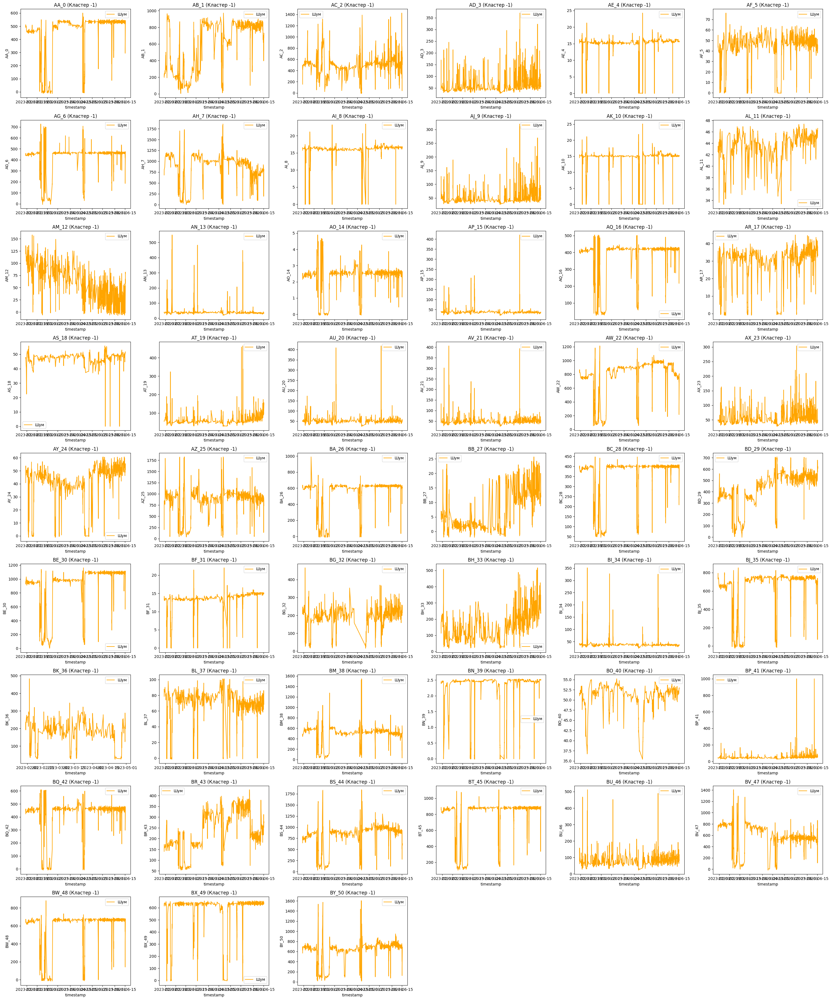

In [ ]:
anomalies = df[df['anomaly_cluster'] == -1]
print(f"Количество записей в кластере -1 (шум): {len(anomalies)}")

fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
axes = axes.flatten()

for i, column in enumerate(sensor_columns):
    ax = axes[i]
    sns.lineplot(x=anomalies['timestamp'], y=anomalies[column], color='orange', label='Шум', ax=ax)
    ax.set_title(f"{column} (Кластер -1)")
    ax.legend()

for i in range(n, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

1. Создание признаков: Признаки для каждого временного ряда генерируются на основе статистики (среднее, стандартное отклонение, минимум, максимум и размах). Эти признаки помогают описать данные более информативно.
2. Алгоритм кластеризации KMeans: Алгоритм KMeans используется для кластеризации аномальных данных, выявленных на предыдущем шаге. Это позволяет разделить аномалии на несколько групп с похожими характеристиками.
3. Обновление данных: Новый столбец с группами аномалий добавляется в исходные данные, что помогает дальше классифицировать аномалии и проводить их анализ.
4. Визуализация: Построение графиков временных рядов для каждой группы аномалий позволяет наглядно увидеть, как ведут себя аномалии и их связь с сенсорами, что помогает в дальнейшей интерпретации.

Статистика по группам аномалий:
                 AA_0                                                 \
                count        mean         std        min         25%   
anomaly_group                                                          
0.0             356.0  452.690551  124.592873  -7.976962  459.584476   
1.0             350.0   71.427574   93.661855 -11.870076    1.748308   
2.0            3069.0  511.347621   53.765862  -5.231533  501.362495   
3.0             112.0  381.466657  174.870383  -4.511966  319.246232   
4.0             236.0  265.780799  124.525509 -12.310540  152.098401   

                                                     AB_1              ...  \
                      50%         75%         max   count        mean  ...   
anomaly_group                                                          ...   
0.0            498.971514  529.068773  545.210544   356.0  551.394897  ...   
1.0             29.754166  116.767765  352.596137   350.0  145.884322  ...   
2

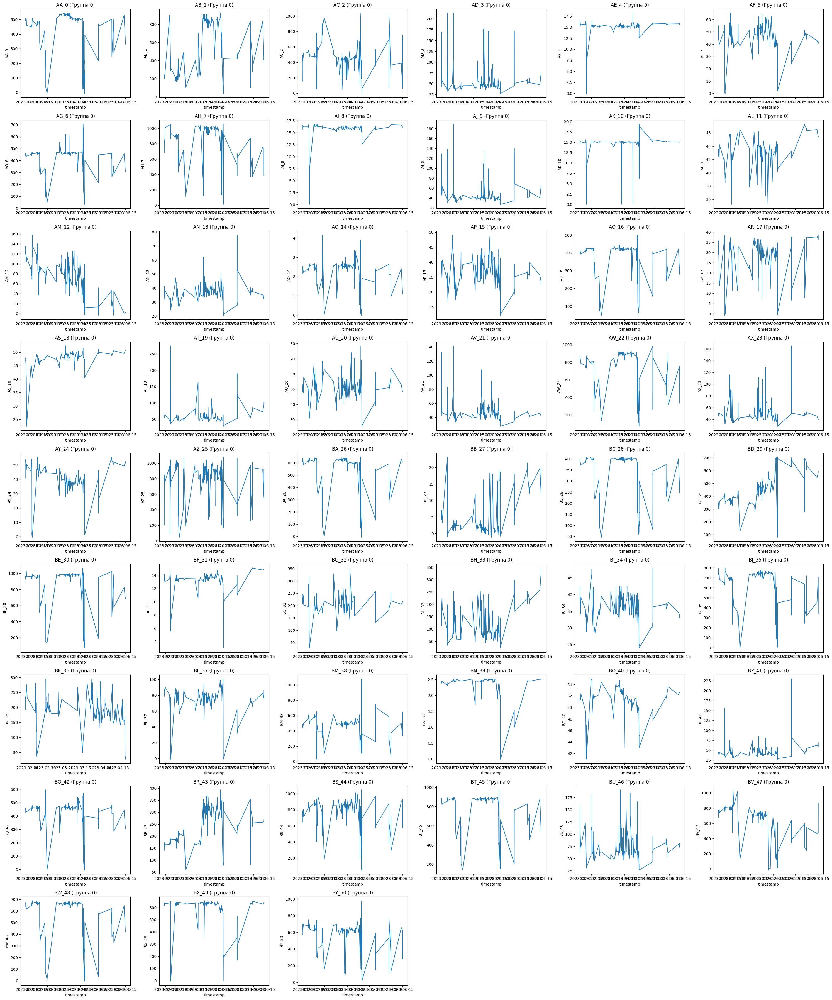

Группа аномалий 3:
          Unnamed: 0        AA_0        AB_1         AC_2        AD_3  \
count     112.000000  112.000000  112.000000   112.000000  112.000000   
mean    96458.008929  381.466657  480.321671   495.848745   41.988755   
min      2343.000000   -4.511966   49.545868    -9.386479   26.486503   
25%     68248.500000  319.246232  343.478845   249.363971   28.643450   
50%    115395.000000  456.145158  484.936410   350.060005   38.760811   
75%    116144.500000  489.518570  656.289360   768.188602   47.253673   
max    194858.000000  566.628431  971.767929  1425.620963  125.537016   
std     37499.223873  174.870383  232.122404   391.440370   18.297894   

             AE_4        AF_5        AG_6         AH_7        AI_8  ...  \
count  112.000000  112.000000  112.000000   112.000000  112.000000  ...   
mean    12.346791   26.274872  374.130262  1113.976736   13.031964  ...   
min     -0.013462    1.606144   29.816326    64.412578   -0.028872  ...   
25%     12.677976    2.

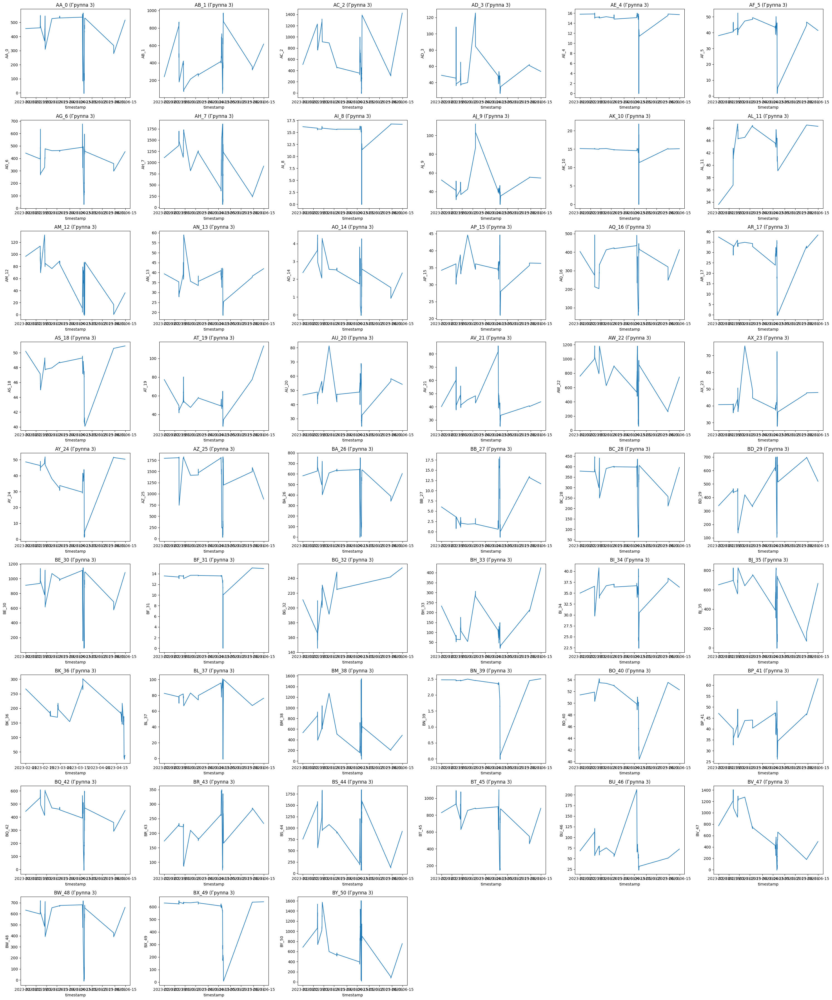

Группа аномалий 2:
          Unnamed: 0         AA_0         AB_1         AC_2         AD_3  \
count    3069.000000  3069.000000  3069.000000  3069.000000  3069.000000   
mean   121620.712610   511.347621   669.210322   523.355975    82.103067   
min      3095.000000    -5.231533    82.301529    -4.401701    27.315745   
25%     59085.000000   501.362495   447.166180   491.459875    44.878658   
50%    151987.000000   531.133494   806.517071   520.093221    62.755781   
75%    172973.000000   536.121135   837.602873   545.904482   101.885494   
max    195936.000000   600.206621   963.673244  1358.575183   370.089086   
std     63504.544869    53.765862   230.197886   101.967976    53.042076   

              AE_4         AF_5         AG_6         AH_7         AI_8  ...  \
count  3066.000000  3069.000000  3069.000000  3069.000000  3060.000000  ...   
mean     14.792158    36.017605   458.004047   912.627242    15.549784  ...   
min      -0.047597    -0.583856    46.075157    88.805118  

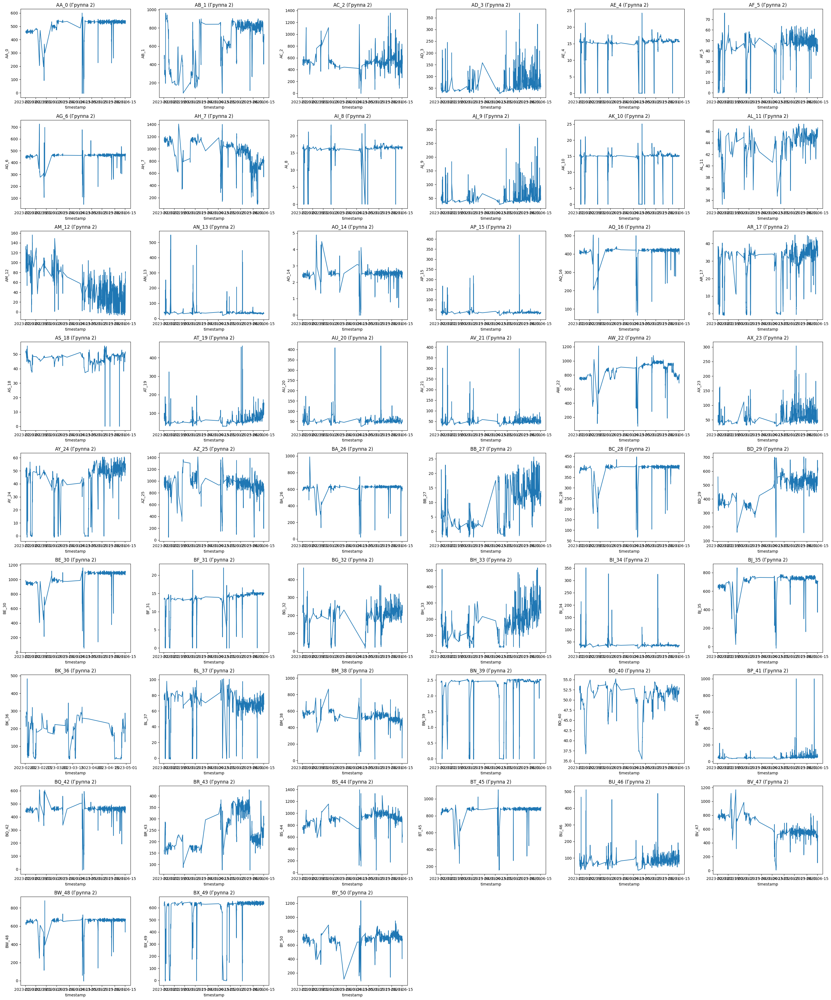

Группа аномалий 4:
          Unnamed: 0        AA_0        AB_1        AC_2        AD_3  \
count     236.000000  236.000000  236.000000  236.000000  236.000000   
mean   109947.317797  265.780799  397.693993  509.004401   58.049648   
min     27502.000000  -12.310540   42.344914   -7.578121   27.200193   
25%    112308.750000  152.098401  350.690722  367.519330   39.123297   
50%    115479.000000  295.011325  434.598986  525.536077   48.650559   
75%    142936.250000  375.452823  466.372592  695.351892   64.937182   
max    195486.000000  445.585564  857.749081  914.884512  175.108899   
std     47898.447177  124.525509  161.284834  238.025929   28.668716   

             AE_4        AF_5        AG_6        AH_7        AI_8  ...  \
count  236.000000  236.000000  236.000000  236.000000  236.000000  ...   
mean    15.338682   37.805871  315.349670  482.600982   15.793209  ...   
min     12.574648    1.698575  103.021785    4.885873   12.500539  ...   
25%     15.212829   38.324874  217.3

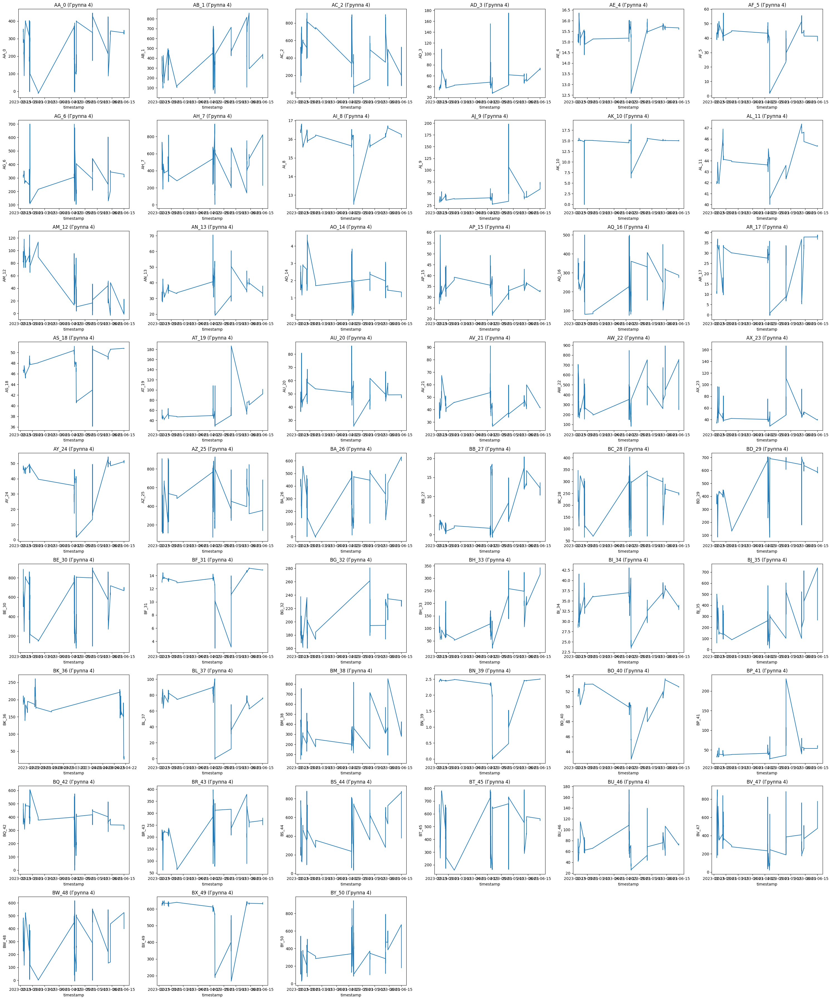

Группа аномалий 1:
          Unnamed: 0        AA_0        AB_1        AC_2        AD_3  \
count     355.000000  350.000000  350.000000  350.000000  355.000000   
mean    56824.470423   71.427574  145.884322  342.665807   76.000170   
min     27515.000000  -11.870076    4.184311   -7.519276   28.192453   
25%     33073.500000    1.748308   73.841565  289.042276   41.829675   
50%     37620.000000   29.754166   98.015684  339.481086   55.084521   
75%     49319.500000  116.767765  133.190585  463.006854  105.223159   
max    195485.000000  352.596137  696.589299  734.888711  220.015306   
std     38893.929975   93.661855  131.128314  177.618174   43.749840   

             AE_4        AF_5        AG_6        AH_7        AI_8  ...  \
count  355.000000  355.000000  350.000000  350.000000  355.000000  ...   
mean    15.388675   45.479456  155.131562  170.114270   16.206191  ...   
min     12.433917    0.292749   -5.687107    3.756158   12.624118  ...   
25%     15.110453   41.470824   32.4

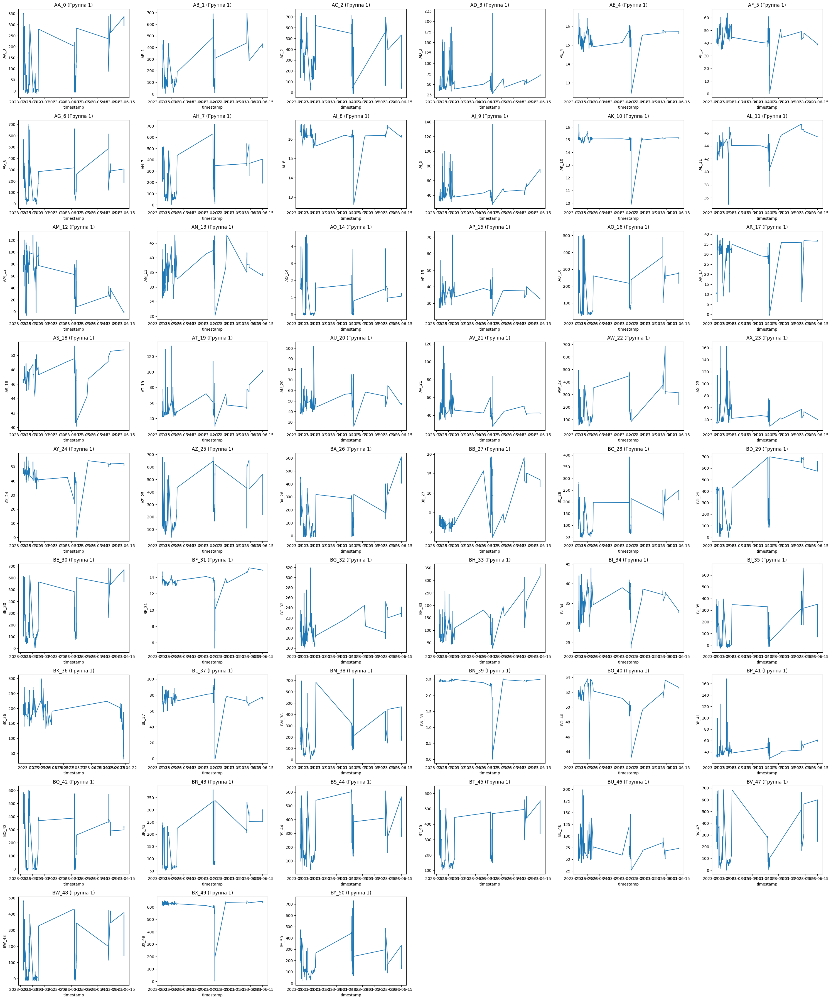

In [ ]:
from sklearn.cluster import KMeans

# Создание новых признаков на основе статистики временных окон
def create_features(df, sensor_columns):
    feature_df = pd.DataFrame()
    feature_df['mean'] = df[sensor_columns].mean(axis=1)
    feature_df['std'] = df[sensor_columns].std(axis=1)
    feature_df['min'] = df[sensor_columns].min(axis=1)
    feature_df['max'] = df[sensor_columns].max(axis=1)
    feature_df['range'] = feature_df['max'] - feature_df['min']
    return feature_df

feature_data = create_features(df, sensor_columns)

# Кластеризация аномалий с использованием KMeans
anomaly_data = feature_data[df['anomaly_cluster'] == -1].copy()

kmeans = KMeans(n_clusters=5, random_state=42)
anomaly_data['anomaly_group'] = kmeans.fit_predict(anomaly_data)

# Обновление DataFrame с новой классификацией
df.loc[df['anomaly_cluster'] == -1, 'anomaly_group'] = anomaly_data['anomaly_group']

# Статистика по новым группам аномалий
anomaly_group_stats = df[df['anomaly_group'].notnull()].groupby('anomaly_group')[sensor_columns].describe()
print("Статистика по группам аномалий:")
print(anomaly_group_stats)

# Визуализация новых групп аномалий
for group in anomaly_data['anomaly_group'].unique():
    group_data = df[df['anomaly_group'] == group]
    print(f"Группа аномалий {group}:")
    print(group_data.describe())

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 4))
    axes = axes.flatten()

    for i, column in enumerate(sensor_columns):
        ax = axes[i]
        sns.lineplot(x=group_data['timestamp'], y=group_data[column], ax=ax)
        ax.set_title(f"{column} (Группа {group})")

    for i in range(n, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

**Данный этап позволяет провести сравнительный анализ различных методов для выявления аномалий в данных. Применение Z-оценки, Isolation Forest и Local Outlier Factor дает возможность не только выявить аномалии, но и оценить эффективность каждого метода на основе количества обнаруженных аномальных точек. Визуализация помогает в интерпретации результатов и выборе наиболее подходящего метода для данной задачи.**

1. Метод Z-оценки: Этот метод анализирует отклонения значений от среднего и помечает как аномальные те данные, которые имеют Z-оценку больше заданного порога (например, 3). Это позволяет выявить экстремальные отклонения.

2. Isolation Forest: Алгоритм, который разделяет данные на основе случайных разбиений, и аномальные точки оказываются изолированными с меньшими разбиениями. Этот метод хорошо работает с высокоразмерными данными.

3. Local Outlier Factor (LOF): LOF оценивает плотность данных, сравнивая объект с его ближайшими соседями. Если точка значительно отличается от своих соседей по плотности, она считается аномальной.

4. Сравнение методов: Для всех трех методов вычисляется количество аномалий, найденных каждым методом. Это позволяет наглядно понять, какие методы более чувствительны или точны в обнаружении аномалий для данного набора данных.

Метод z_anomaly: 48951 аномалий
Метод iso_anomaly: 9804 аномалий
Метод lof_anomaly: 9804 аномалий


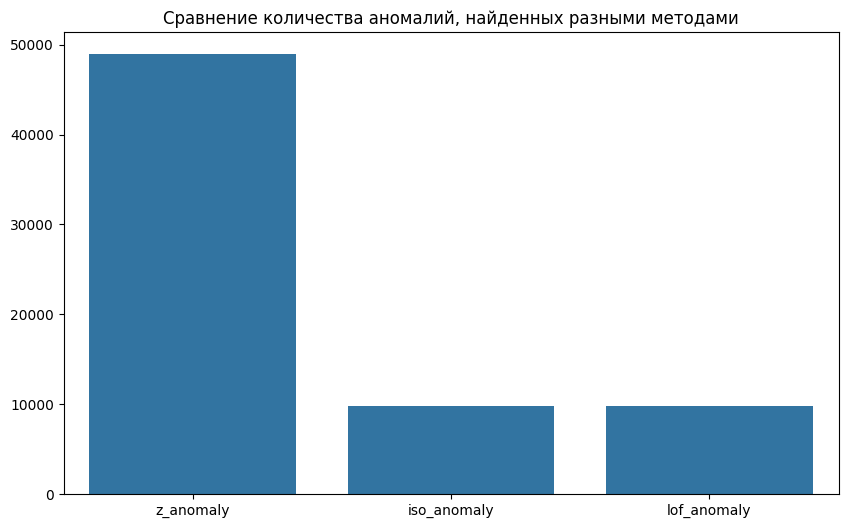

In [ ]:
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

# Метод Z-оценки
z_scores = np.abs((data - data.mean()) / data.std())
z_threshold = 3  # Порог для определения аномалий
df['z_anomaly'] = (z_scores > z_threshold).any(axis=1).astype(int)

# Метод Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_labels = iso_forest.fit_predict(data_scaled)
df['iso_anomaly'] = (iso_labels == -1).astype(int)

# Метод Local Outlier Factor (LOF)
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
lof_labels = lof.fit_predict(data_scaled)
df['lof_anomaly'] = (lof_labels == -1).astype(int)

# Сравнение методов
methods = ['z_anomaly', 'iso_anomaly', 'lof_anomaly']
for method in methods:
    print(f"Метод {method}: {df[method].sum()} аномалий")

# Визуализация сравнения
plt.figure(figsize=(10, 6))
sns.barplot(x=methods, y=[df[method].sum() for method in methods])
plt.title("Сравнение количества аномалий, найденных разными методами")
plt.show()


**Анализ корреляций**
1. Корреляционная матрица:

Применение корреляционного анализа позволяет выявить зависимости между различными сенсорами и признаками в данных. Это важный шаг для дальнейшего анализа данных, фильтрации или выбора наиболее значимых признаков.
Визуализация матрицы в виде тепловой карты помогает наглядно интерпретировать связи между переменными.
2. Анализ временных зависимостей аномалий:

Создание признаков для анализа временных зависимостей (часы, дни недели) позволяет выявить, как аномалии распределяются во времени.
Визуализация аномалий по часам и дням недели помогает обнаружить паттерны или циклические зависимости, которые могут быть полезны для улучшения мониторинга и прогнозирования аномальных событий.

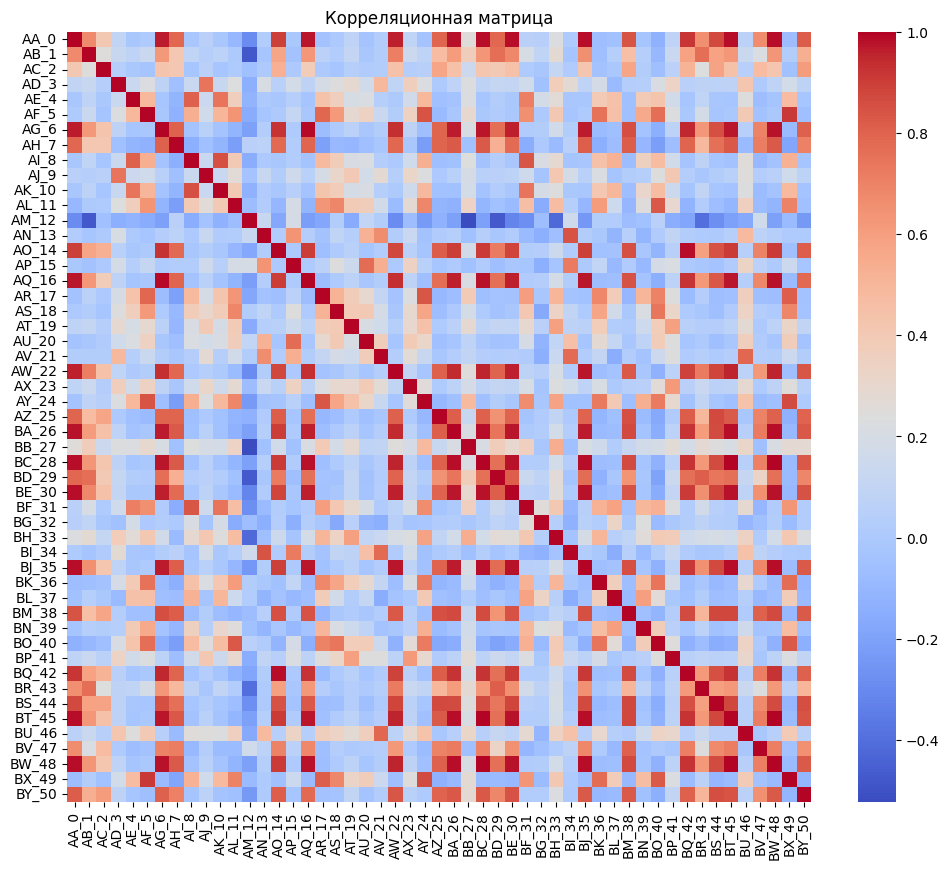

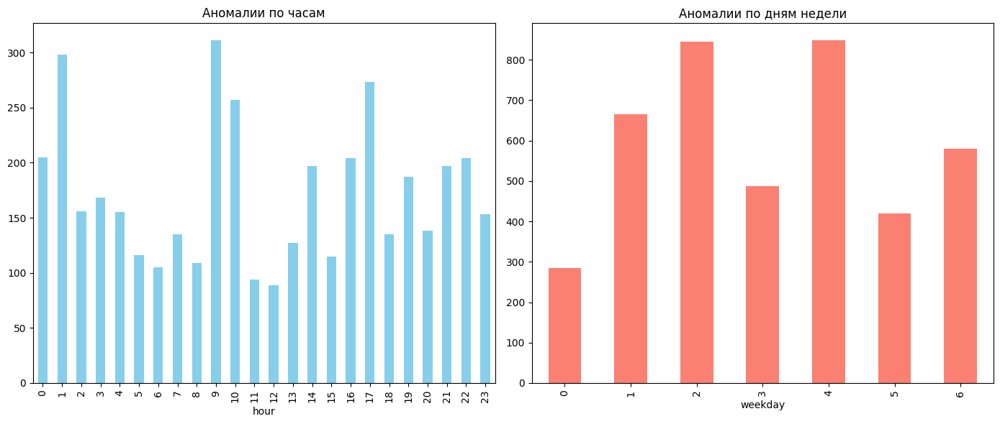

In [ ]:
# Корреляционная матрица
correlation_matrix = data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title("Корреляционная матрица")
plt.show()

# Временные зависимости аномалий
df['hour'] = df['timestamp'].dt.hour
df['weekday'] = df['timestamp'].dt.weekday

hourly_anomalies = df[df['anomaly_cluster'] == -1].groupby('hour').size()
weekday_anomalies = df[df['anomaly_cluster'] == -1].groupby('weekday').size()

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
hourly_anomalies.plot(kind='bar', color='skyblue', title="Аномалии по часам")
plt.subplot(1, 2, 2)
weekday_anomalies.plot(kind='bar', color='salmon', title="Аномалии по дням недели")
plt.tight_layout()
plt.show()

1. Проверка пропущенных данных: Использовался метод isnull() для выявления пропущенных значений в наборе данных, что важно для дальнейшей обработки данных. Метод sum() помогает подсчитать, сколько пропусков содержится в каждом столбце.

2. Заполнение пропусков:

Заполнение средним: Метод полезен, если пропуски случайны и данные нормально распределены. Среднее значение не влияет сильно на данные, если нет выбросов.
Заполнение медианой: Этот метод используется, когда в данных есть выбросы, так как медиана менее чувствительна к ним, чем среднее. Заполнение медианой может быть предпочтительнее в таких случаях, чтобы не искажать данные.
Оценка влияния на аномалии:

3. DBSCAN был использован для кластеризации, чтобы выявить аномалии. Количество найденных аномалий было сравнено для данных с разными методами обработки пропусков (средним и медианой). Это позволяет оценить, какой метод лучше сохраняет структуру данных, не увеличивая количество ложных аномалий.

In [ ]:
# Проверка пропущенных данных
missing_data = data.isnull().sum()
print("Пропущенные значения в данных:")
print(missing_data[missing_data > 0])

# Выбор стратегии обработки
data_imputed_mean = data.fillna(data.mean())  # Заполнение средним
data_imputed_median = data.fillna(data.median())  # Заполнение медианой

# Влияние на аномалии (пример для DBSCAN)
dbscan_mean = DBSCAN(eps=1.5, min_samples=5).fit_predict(StandardScaler().fit_transform(data_imputed_mean))
dbscan_median = DBSCAN(eps=1.5, min_samples=5).fit_predict(StandardScaler().fit_transform(data_imputed_median))

print(f"Аномалий с заполнением средним: {(dbscan_mean == -1).sum()}")
print(f"Аномалий с заполнением медианой: {(dbscan_median == -1).sum()}")

Пропущенные значения в данных:
Series([], dtype: int64)
Аномалий с заполнением средним: 4128
Аномалий с заполнением медианой: 4128


1. Анализ распределения аномалий по группам:

groupby('anomaly_group'): Группировка данных по метке аномалии для каждой записи.
size(): Подсчет количества записей в каждой группе аномалий.
Этот метод позволяет оценить, как аномалии распределяются между различными группами, выявленными алгоритмом KMeans. Распределение помогает понять, насколько сбалансированы группы аномалий.
2. Влияние аномалий на производственные процессы:

notnull() и astype(int): Создание бинарного признака, который указывает, является ли запись аномальной.
Это позволяет проанализировать, как аномалии влияют на данные по времени, создавая основу для анализа тренда аномалий во времени.
3. Анализ тренда аномалий во времени:

groupby('timestamp'): Группировка данных по временной метке, что позволяет отслеживать изменения в частоте аномалий с течением времени.
sum(): Подсчет количества аномалий для каждой временной метки.
Построение графика тренда: Визуализация тренда аномалий позволяет исследовать динамику изменений и выявлять возможные аномалии в процессе работы.

Распределение аномалий по группам:
anomaly_group
0.0     356
1.0     355
2.0    3069
3.0     112
4.0     236
dtype: int64


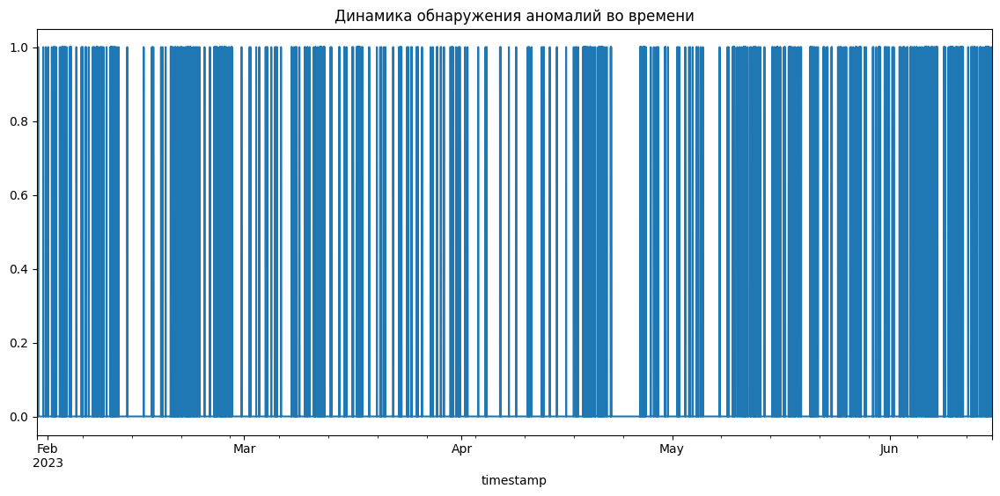

In [ ]:
# Анализ распределения аномалий
anomaly_distribution = df.groupby('anomaly_group').size()
print("Распределение аномалий по группам:")
print(anomaly_distribution)

# Влияние аномалий на производственные процессы
df['is_anomaly'] = df['anomaly_group'].notnull().astype(int)
anomaly_trend = df.groupby('timestamp')['is_anomaly'].sum()
anomaly_trend.plot(figsize=(14, 6), title="Динамика обнаружения аномалий во времени")
plt.show()

**Оформление визуализации результатов**
1. Графики для классов аномалий:

Используется линейный график (с помощью sns.lineplot), чтобы визуализировать данные для каждой группы аномалий, полученной методом кластеризации KMeans.
Это позволяет наблюдать поведение сенсоров в рамках каждой группы аномалий и сравнить их с нормальными паттернами.
2. Тепловая карта для методов:

Тепловая карта (с помощью sns.heatmap) используется для отображения корреляции между различными методами обнаружения аномалий. Это помогает выявить, насколько согласуются результаты разных методов, и позволяет оценить, какие из них могут быть использованы для комбинирования или улучшения точности.

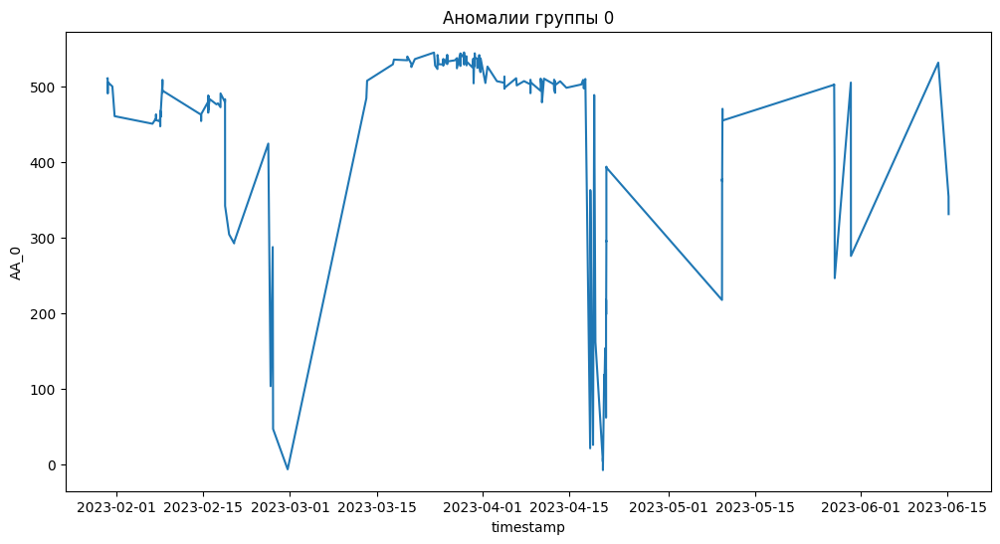

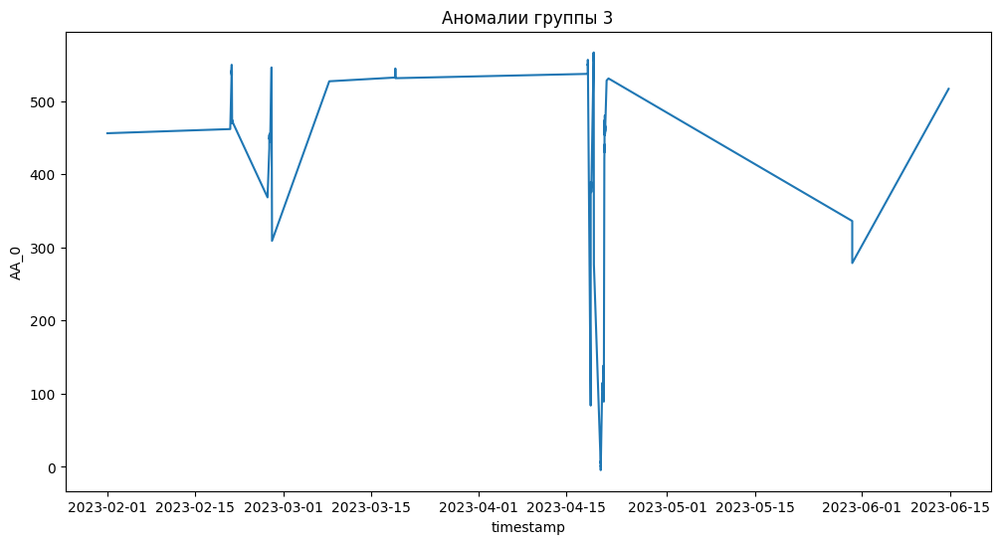

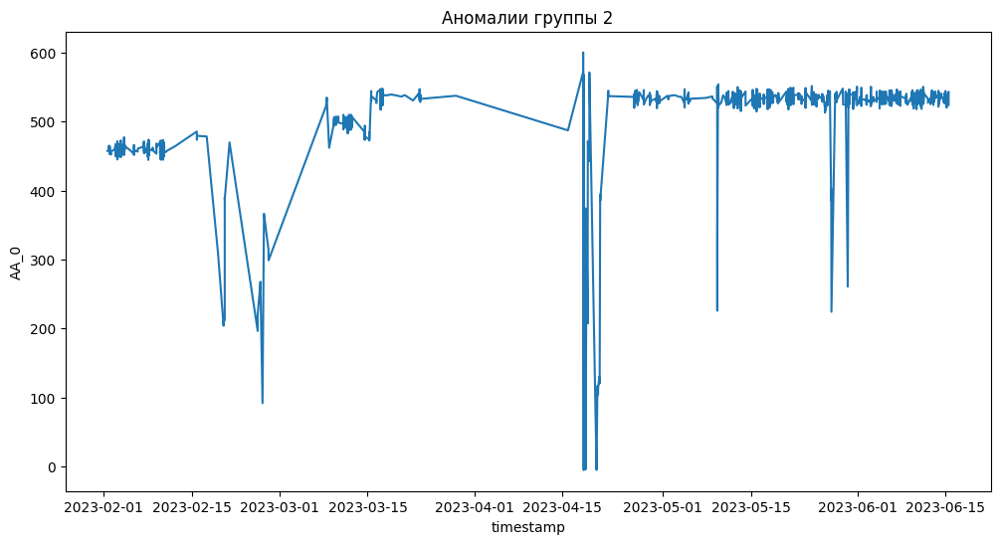

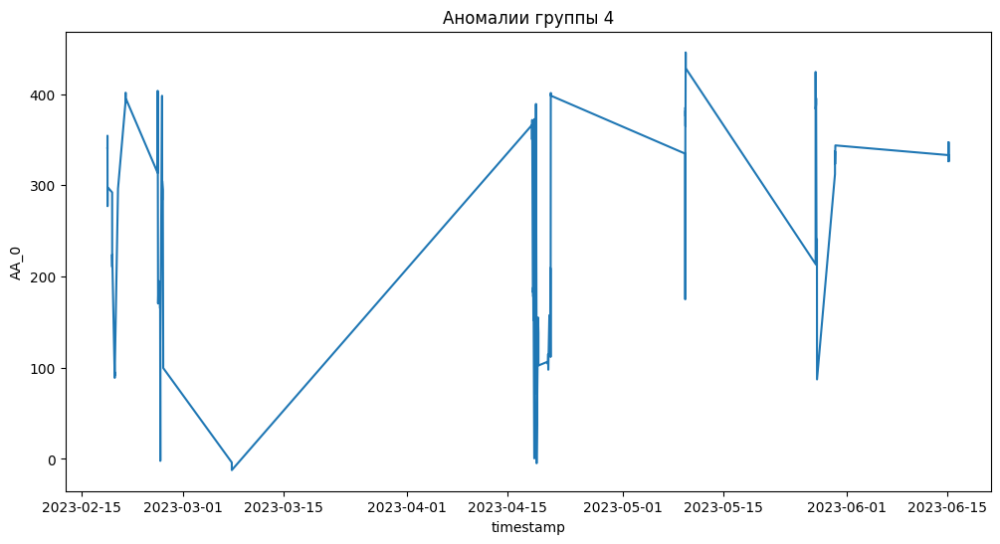

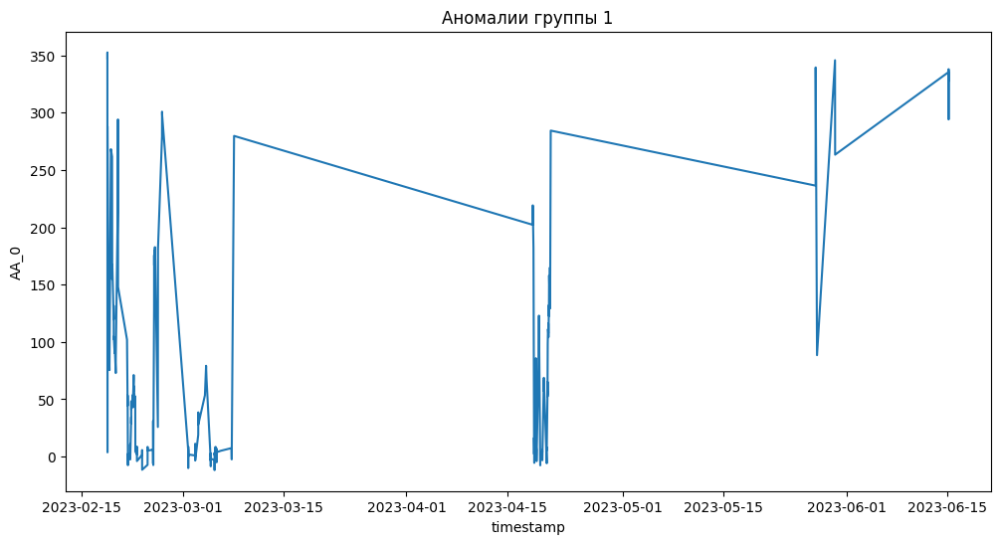

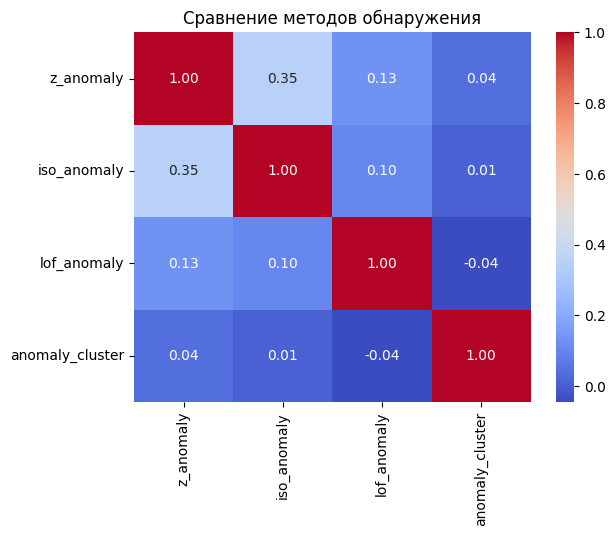

In [ ]:
# Графики для классов аномалий
for group in anomaly_data['anomaly_group'].unique():
    group_data = df[df['anomaly_group'] == group]
    plt.figure(figsize=(12, 6))
    sns.lineplot(x=group_data['timestamp'], y=group_data[sensor_columns[0]])
    plt.title(f"Аномалии группы {group}")
    plt.show()

# Тепловая карта для методов
method_comparison = df[methods + ['anomaly_cluster']].corr()
sns.heatmap(method_comparison, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Сравнение методов обнаружения")
plt.show()